In [1]:
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text as text
import pandas as pd
import os

from official.nlp import optimization  # to create AdamW optimizer

# pip install -U "tensorflow-text==2.15.*"
# pip install "tf-models-official==2.15.*"
#python --info
#%load_ext tensorboard

2024-12-22 17:01:09.551233: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-22 17:01:09.747783: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-22 17:01:09.747921: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-22 17:01:09.781265: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-22 17:01:09.853272: I tensorflow/core/platform/cpu_feature_guar

In [2]:
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))
tf.debugging.set_log_device_placement(True)
print("GPUs:", tf.config.list_physical_devices('GPU'))

Num GPUs Available: 0
GPUs: []


                                              Review  Rating
0  nice hotel expensive parking got good deal sta...       1
1  ok nothing special charge diamond member hilto...       0
2  nice rooms not 4* experience hotel monaco seat...       0
3  unique, great stay, wonderful time hotel monac...       1
4  great stay great stay, went seahawk game aweso...       1
Distribution raw dataset : [1421, 1793, 2184, 6039, 9054]
Distribution binary classification : [5398, 15093]


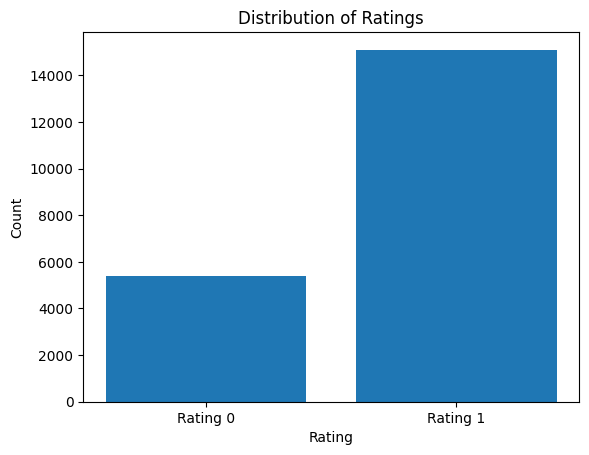

In [8]:
# Load the text data
file_path = os.path.join('Data', 'tripadvisor_hotel_reviews.csv') #"Restaurant_Reviews.tsv"
data = pd.read_csv(file_path)  # Assumes comma separator

# Check data distribution
rating_distribution = [0, 0, 0, 0, 0]
for res in data['Rating']:
    if res >= 1 and res <= 5:
        rating_distribution[res-1] = rating_distribution[res-1] + 1

# Rating between 0 and 1
data['Rating'] = (data['Rating'] > 3).astype(int)

# Display the first few rows
print(data.head())

# Check data distribution
rating_distribution_binary = [0, 0]
for res in data['Rating']:
    if res == 1 or res == 0:
        rating_distribution_binary[res] = rating_distribution_binary[res] + 1
print(f"Distribution raw dataset : {rating_distribution}")
print(f"Distribution binary classification : {rating_distribution_binary}")
# Display a graph of the distribution
labels = ['Rating 0', 'Rating 1']
plt.bar(labels, rating_distribution_binary)
plt.xlabel('Rating')
plt.ylabel('Count')
plt.title('Distribution of Ratings')
plt.show()

In [89]:
AUTOTUNE = tf.data.AUTOTUNE # Load data asynchronously to not block everything
batch_size = 32
seed = 42

# Convert pandas DataFrame to tf.data.Dataset
def dataframe_to_dataset(data, _batch_size=32):
    """
    Convert a pandas DataFrame to a tf.data.Dataset.

    Args:
        data (pd.DataFrame): The input DataFrame containing the data.
        batch_size (int): Batch size for the dataset.

    Returns:
        tf.data.Dataset: The TensorFlow dataset.
    """
    # Convert the DataFrame to a dictionary format
    dataset = tf.data.Dataset.from_tensor_slices((data["Review"].values, data["Rating"].values))
    # Shuffle and batch the dataset (mix the data)
    dataset = dataset.shuffle(buffer_size=len(data)).batch(_batch_size).prefetch(buffer_size=AUTOTUNE)
    return dataset

# Split the dataset into training, validation, and testing
train_size = int(0.8 * len(data))  # 80% for training
val_size = int(0.1 * len(data))    # 10% for validation and 10% for test

train_data = data[:train_size]
val_data = data[train_size:train_size + val_size]
test_data = data[train_size + val_size:]

# Create tf.data.Dataset objects
train_ds = dataframe_to_dataset(train_data, _batch_size=batch_size)
# Used during the training, at each epoch, compute the error between the prediction and the truth
val_ds = dataframe_to_dataset(val_data, _batch_size=batch_size)
test_ds = dataframe_to_dataset(test_data, _batch_size=batch_size)

# Display an example from the training dataset
for text, label in train_ds.take(1):
    print(f"Text: {text.numpy()[:3]}")  # Display 3 examples
    print(f"Label: {label.numpy()[:3]}")


Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
components_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
components_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
TensorSliceDataset: (TensorSliceDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorSliceDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DummySeedGenerator in device /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
seed: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
seed2: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
seed__generator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
ShuffleDatasetV3: (ShuffleDatasetV3): /job:localh

2024-12-22 11:28:01.681767: I tensorflow/core/common_runtime/placer.cc:125] components_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:01.681794: I tensorflow/core/common_runtime/placer.cc:125] components_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:01.681806: I tensorflow/core/common_runtime/placer.cc:125] TensorSliceDataset: (TensorSliceDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:01.681815: I tensorflow/core/common_runtime/placer.cc:125] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:01.684719: I tensorflow/core/common_runtime/placer.cc:125] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:01.684744: I tensorflow/core/common_runtime/placer.cc:125] buffer__size: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:01.684757: I tensorflow/core/common_runtime/placer.cc:125] seed: (_Arg): /job:localhost/replica:0/t

In [90]:
# Same data preprocessing as BERT
# Small BERT
#encoder_url = 'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1'
#preprocess_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3'

# Base BERT
encoder_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
preprocess_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3'

In [91]:
# Instantiate the Keras' layers from the given BERT
bert_model = hub.KerasLayer(encoder_url)
bert_preprocess_model = hub.KerasLayer(preprocess_url)

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:

2024-12-22 11:28:08.087241: I tensorflow/core/common_runtime/placer.cc:125] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:08.087272: I tensorflow/core/common_runtime/placer.cc:125] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:08.087284: I tensorflow/core/common_runtime/placer.cc:125] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:08.087292: I tensorflow/core/common_runtime/placer.cc:125] Func/StatefulPartitionedCall/input_control_node/_0: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:08.087300: I tensorflow/core/common_runtime/placer.cc:125] StatefulPartitionedCall/Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:08.087307: I tensorflow/core/common_runtime/placer.cc:125] Func/StatefulPartitionedCall/output/_1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:08.087315: I tensorflow/core/common

In [92]:
# Test
test_text = ['This flat is very dirty and very noisy due to the thin windows!!']
preprocessed_test_text = bert_preprocess_model(test_text)
print(preprocessed_test_text.keys())

unknown: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
unknown_0: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:GPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
Identity_1: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
Identity_2: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
identity_1_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
identity_2_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
Func/StatefulPartitionedCall/input/_0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
Func/StatefulPartitionedCall/input/_1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
Func/StatefulPartitionedCall/input/_2: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
StatefulPartitionedCall/Identity: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
Stateful

2024-12-22 11:28:08.235602: I tensorflow/core/common_runtime/placer.cc:125] unknown: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:08.235637: I tensorflow/core/common_runtime/placer.cc:125] unknown_0: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:08.235649: I tensorflow/core/common_runtime/placer.cc:125] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:08.235658: I tensorflow/core/common_runtime/placer.cc:125] Identity: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:08.235666: I tensorflow/core/common_runtime/placer.cc:125] Identity_1: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:08.235674: I tensorflow/core/common_runtime/placer.cc:125] Identity_2: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:08.235682: I tensorflow/core/common_runtime/placer.cc:125] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-

Executing op __inference_restored_function_body_423413 in device /job:localhost/replica:0/task:0/device:GPU:0
dict_keys(['input_word_ids', 'input_mask', 'input_type_ids'])


In [93]:
bert_test_result = bert_model(preprocessed_test_text)
print(bert_test_result)

inputs_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
inputs_2: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
inputs: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
unknown: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_0: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_1: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_2: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_3: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_4: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_5: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_6: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_7: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_8: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_9: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_10: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
unknown_11: (_Arg): /job:localhost/replica:0/t

2024-12-22 11:28:08.443630: I tensorflow/core/common_runtime/placer.cc:125] inputs_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:08.443666: I tensorflow/core/common_runtime/placer.cc:125] inputs_2: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:08.443675: I tensorflow/core/common_runtime/placer.cc:125] inputs: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:08.443683: I tensorflow/core/common_runtime/placer.cc:125] unknown: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:08.443690: I tensorflow/core/common_runtime/placer.cc:125] unknown_0: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:08.443697: I tensorflow/core/common_runtime/placer.cc:125] unknown_1: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:08.443705: I tensorflow/core/common_runtime/placer.cc:125] unknown_2: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:08.443712:

Executing op __inference_restored_function_body_423849 in device /job:localhost/replica:0/task:0/device:GPU:0
{'sequence_output': <tf.Tensor: shape=(1, 128, 768), dtype=float32, numpy=
array([[[ 0.3587028 ,  0.19466221,  0.5346577 , ..., -0.40260574,
          0.01102172,  0.535997  ],
        [ 0.01034355, -0.15209423, -0.07906551, ..., -0.94070625,
          0.72438115,  0.41762158],
        [ 0.7896712 ,  0.13310397,  0.59805876, ..., -0.27326813,
         -0.2842237 ,  0.7624668 ],
        ...,
        [ 0.49326655, -0.35976616,  0.29239863, ...,  0.58972716,
         -0.2144967 , -0.6593686 ],
        [ 0.47009125, -0.0870222 ,  0.6293444 , ...,  0.24451378,
         -0.26885027, -0.22137763],
        [ 0.47008044, -0.09184549,  0.67809355, ...,  0.14045691,
         -0.25653154, -0.18751293]]], dtype=float32)>, 'default': <tf.Tensor: shape=(1, 768), dtype=float32, numpy=
array([[-0.81816906, -0.51638603, -0.94298625,  0.77323914,  0.8251909 ,
        -0.21841241,  0.83604056,  0.

In [94]:
def build_classifier_model():
    text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')
    preprocessing_layer = hub.KerasLayer(preprocess_url, name='preprocessing')
    encoder_input = preprocessing_layer(text_input)
    encoder = hub.KerasLayer(encoder_url, trainable=True, name='BERT_encoder')

    output = encoder(encoder_input)

    net = output['pooled_output']
    net = tf.keras.layers.Dropout(0.2)(net) # Dropout layer applied to net

    # 5 because 5 classes
    net = tf.keras.layers.Dense(1, name='Classifier')(net)
    #net = tf.keras.layers.Dense(5, name='Classifier')(net) # dense layer applied to net

    return tf.keras.Model(text_input, net)

In [95]:
# Create the classifier modem
classifier_model = build_classifier_model()

# Test the (not yet fine tuned) classifier model
# tf.constant() transorm a non-tonsor (here a string) into a tensor
raw_result = classifier_model(tf.constant(test_text))

print(tf.sigmoid(raw_result))
# Use softmax to get probabilities for each class
#probabilities = tf.nn.softmax(raw_result)
#print(probabilities)

Identity: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
Func/PartitionedCall/input_control_node/_0: (NoOp): /job:localhost/replica:0/task:0/device:GPU:0
PartitionedCall/Identity: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
Func/PartitionedCall/output/_1: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
Func/PartitionedCall/output_control_node/_2: (NoOp): /job:localhost/replica:0/task:0/device:GPU:0
PartitionedCall: (NoOp): /job:localhost/replica:0/task:0/device:GPU:0
PartitionedCall/Const: (Const): /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_restored_function_body_429388 in device /job:localhost/replica:0/task:0/device:GPU:0


2024-12-22 11:28:10.560801: I tensorflow/core/common_runtime/placer.cc:125] Identity: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:10.560838: I tensorflow/core/common_runtime/placer.cc:125] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:10.560848: I tensorflow/core/common_runtime/placer.cc:125] Func/PartitionedCall/input_control_node/_0: (NoOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:10.560858: I tensorflow/core/common_runtime/placer.cc:125] PartitionedCall/Identity: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:10.560867: I tensorflow/core/common_runtime/placer.cc:125] Func/PartitionedCall/output/_1: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:10.560875: I tensorflow/core/common_runtime/placer.cc:125] Func/PartitionedCall/output_control_node/_2: (NoOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:10.560883: I tensorf

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
Func/StatefulPartitionedCall/input_control_node/_0: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
StatefulPartitionedCall/Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
Func/StatefulPartitionedCall/output/_1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
Func/StatefulPartitionedCall/output_control_node/_2: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
StatefulPartitionedCall: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
StatefulPartitionedCall/hash_table: (HashTableV2): /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_restored_function_body_430934 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /jo

2024-12-22 11:28:11.578924: I tensorflow/core/common_runtime/placer.cc:125] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:11.578972: I tensorflow/core/common_runtime/placer.cc:125] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:11.578987: I tensorflow/core/common_runtime/placer.cc:125] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:11.578999: I tensorflow/core/common_runtime/placer.cc:125] Func/StatefulPartitionedCall/input_control_node/_0: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:11.579009: I tensorflow/core/common_runtime/placer.cc:125] StatefulPartitionedCall/Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:11.579019: I tensorflow/core/common_runtime/placer.cc:125] Func/StatefulPartitionedCall/output/_1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:11.579029: I tensorflow/core/common

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:

2024-12-22 11:28:17.286445: I tensorflow/core/common_runtime/placer.cc:125] inputs: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:17.286474: I tensorflow/core/common_runtime/placer.cc:125] unknown: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:17.286483: I tensorflow/core/common_runtime/placer.cc:125] unknown_0: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:17.286493: I tensorflow/core/common_runtime/placer.cc:125] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:17.286501: I tensorflow/core/common_runtime/placer.cc:125] Identity: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:17.286509: I tensorflow/core/common_runtime/placer.cc:125] Identity_1: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:17.286517: I tensorflow/core/common_runtime/placer.cc:125] Identity_2: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:

Executing op __inference_restored_function_body_476602 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op MatMul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op BiasAdd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sigmoid in device /job:localhost/replica:0/task:0/device:GPU:0
tf.Tensor([[0.39185554]], shape=(1, 1), dtype=float32)


In [96]:
classifier_model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 text (InputLayer)           [(None,)]                    0         []                            
                                                                                                  
 preprocessing (KerasLayer)  {'input_mask': (None, 128)   0         ['text[0][0]']                
                             , 'input_type_ids': (None,                                           
                              128),                                                               
                              'input_word_ids': (None,                                            
                             128)}                                                                
                                                                                            

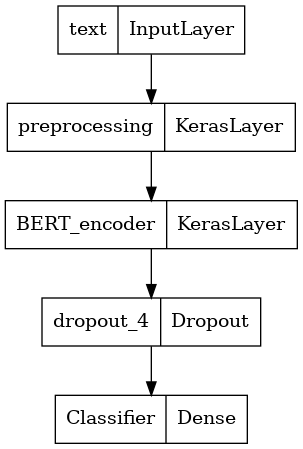

In [97]:
tf.keras.utils.plot_model(classifier_model)

In [98]:
# Define the loss function
loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)
#loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
# Metrics specialized for binary classification (more accurate than Accuracy in this case)
#metrics = tf.keras.metrics.BinaryAccuracy()
#metrics = [tf.keras.metrics.SparseCategoricalAccuracy()]
metrics = [
    tf.keras.metrics.BinaryAccuracy(name='accuracy'),
    tf.keras.metrics.Precision(thresholds=0.5, name='precision'),
    tf.keras.metrics.Recall(thresholds=0.5, name='recall')
]

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:

2024-12-22 11:28:17.719411: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:17.719439: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:17.722223: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:17.722283: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:17.727633: I tensorflow/core/common_runtime/placer.cc:125] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:17.727656: I tensorflow/core/common_runtime/placer.cc:125] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0


In [99]:
# Create training conditions that match what this BERT model is used to

epochs = 5

steps_per_epoch = tf.data.experimental.cardinality(train_ds).numpy()
num_train_steps = steps_per_epoch * epochs
num_warmup_steps = int(0.1 * num_train_steps)

init_lr = 5e-6
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps = num_train_steps,
                                          num_warmup_steps = num_warmup_steps, # Learning rate decrease after the warmup
                                          optimizer_type = 'adamw')

Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0


In [100]:
# Model configuration
classifier_model.compile(optimizer=optimizer, loss=loss, metrics=metrics)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0


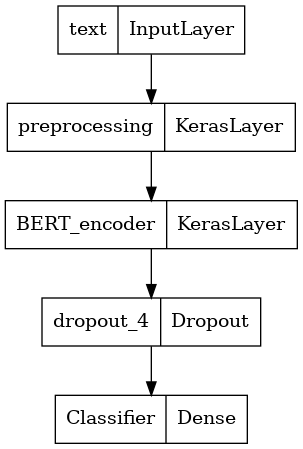

In [101]:
# Verify that the model is not broken
tf.keras.utils.plot_model(classifier_model)

In [102]:
# Train
# Y (labels) are in train_ds
history = classifier_model.fit(x=train_ds, validation_data=val_ds, epochs=epochs)

Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Equal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GreaterEqual in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity i

2024-12-22 11:28:26.126310: I tensorflow/core/common_runtime/placer.cc:125] iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:26.126350: I tensorflow/core/common_runtime/placer.cc:125] model_4_preprocessing_495999: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:28:26.126359: I tensorflow/core/common_runtime/placer.cc:125] model_4_preprocessing_496001: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:26.126367: I tensorflow/core/common_runtime/placer.cc:125] model_4_bert_encoder_496006: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:26.126375: I tensorflow/core/common_runtime/placer.cc:125] model_4_bert_encoder_496008: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:26.126382: I tensorflow/core/common_runtime/placer.cc:125] model_4_bert_encoder_496010: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:28:26.126390: I tensorflow/core/common_runtime/placer.c

Executing op __inference_train_function_499398 in device /job:localhost/replica:0/task:0/device:GPU:0
  1/513 [..............................] - ETA: 1:32:13 - loss: 0.9684 - accuracy: 0.1562 - precision: 0.0000e+00 - recall: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_499398 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/513 [..............................] - ETA: 3:44 - loss: 0.9711 - accuracy: 0.1562 - precision: 0.0000e+00 - recall: 0.0000e+00   Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_499398 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/513 [..............................] - ETA: 3:44 - loss: 0.9568 - accuracy: 0.1771 - precision: 0.0000

2024-12-22 11:32:19.682097: I tensorflow/core/common_runtime/placer.cc:125] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:32:19.682129: I tensorflow/core/common_runtime/placer.cc:125] value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:32:19.682141: I tensorflow/core/common_runtime/placer.cc:125] AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0


iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
model_4_preprocessing_502541: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
model_4_preprocessing_502543: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
model_4_bert_encoder_502548: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
model_4_bert_encoder_502550: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
model_4_bert_encoder_502552: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
model_4_bert_encoder_502554: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
model_4_bert_encoder_502556: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
model_4_bert_encoder_502558: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
model_4_bert_encoder_502560: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
model_4_bert_encoder_502562: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
model_4_bert_encoder_502564: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
model_4_bert_encoder_502566: (_Ar

2024-12-22 11:32:19.910176: I tensorflow/core/common_runtime/placer.cc:125] iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:32:19.910208: I tensorflow/core/common_runtime/placer.cc:125] model_4_preprocessing_502541: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-12-22 11:32:19.910218: I tensorflow/core/common_runtime/placer.cc:125] model_4_preprocessing_502543: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:32:19.910225: I tensorflow/core/common_runtime/placer.cc:125] model_4_bert_encoder_502548: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:32:19.910233: I tensorflow/core/common_runtime/placer.cc:125] model_4_bert_encoder_502550: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:32:19.910240: I tensorflow/core/common_runtime/placer.cc:125] model_4_bert_encoder_502552: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-12-22 11:32:19.910247: I tensorflow/core/common_runtime/placer.c

Executing op __inference_test_function_503149 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_503149 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_503149 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_503149 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

In [103]:
loss, accuracy, precision, recall = classifier_model.evaluate(test_ds)
print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")
print(f"Test Precision: {precision}")
print(f"Test Recall: {recall}")

Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Equal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GreaterEqual in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity i

In [104]:
tests = ['This condo is very dirty',
        'I liked this flat, well decorated and confy',
        "This place is so noisy that I couldn't fall asleep",
        "This appartment is beautiful and i like it very much"
]

results = tf.sigmoid(classifier_model(tf.constant(tests)))

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_restored_function_body_431014 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_restored_function_body_476602 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op MatMul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op BiasAdd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sigmoid in device /job:localhost/replica:0/task:0/device:GPU:0


In [105]:
def printResults(input, res):
    res_print = [f'{input[i]:<30} : {res[i][0]:.6f}' for i in range(len(input))]
    print(*res_print, sep='\n')
    print()

printResults(tests, results)


Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /j

In [106]:
# Save model
classifier_model.save('sentimentAnalysis_model.h5')

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

In [107]:
# TODO: Brancher du SHAP et voir quel token à eu quel impacte
# TODO: Essayer de jouer sur le nombre de trainable params (gel)
# TODO: essayer un BERT plus gros
# TODO: Essayer plus d'epochs

# TODO: essayer de geler des couches de BERT
# Savoir répondre à la question: comment tu explique les résultats ?
# Avoir des pistes d'amélioration